In [1]:
import cv2
import matplotlib.pyplot as plt
from skimage.util import random_noise
import numpy as np
import copy

In [2]:
# Display image
def display(original, result, title1 = 'Image1', title2 = 'Image2'):
    plt.figure(figsize=(15, 10))
    #Original
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.title(title1)
    # plt.axis('off')

    #Result
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.title(title2)
    # plt.axis('off')

# Original Images

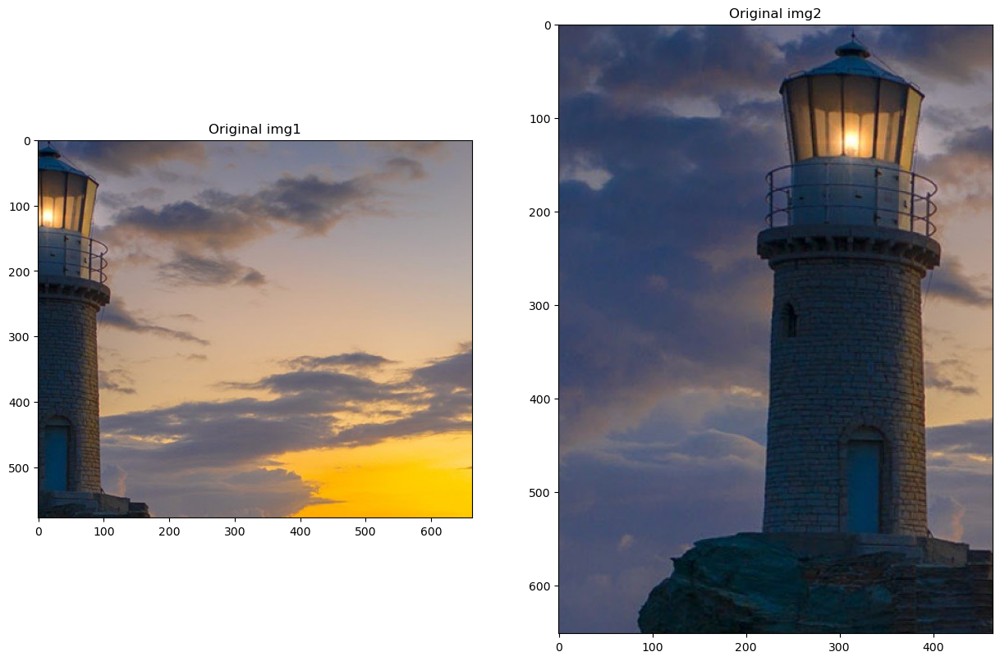

In [3]:
img1 = cv2.imread('./Scene1.png')
img2 = cv2.imread('./Scene2.png')

display(img1, img2, "Original img1", "Original img2")

# Task 1

In [4]:
def SIFT(image, head = None):
    sift = cv2.SIFT_create(nfeatures=head)
    keypoints, descriptors = sift.detectAndCompute(image, None)

    keypoints_img = cv2.drawKeypoints(image, keypoints, None, color=(0,0,255), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)
    
    return keypoints_img

### a) Without limit

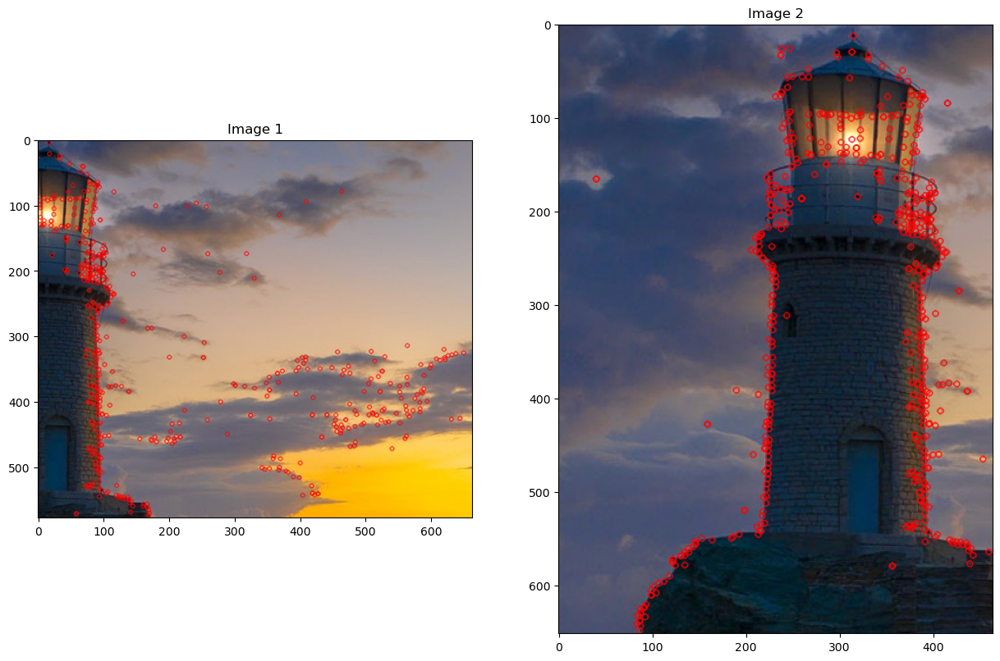

In [5]:
display(SIFT(img1), SIFT(img2), "Image 1", "Image 2")

### b) Top 20 prominent

I have used `nfeatures` to constrain the most prominent key points.

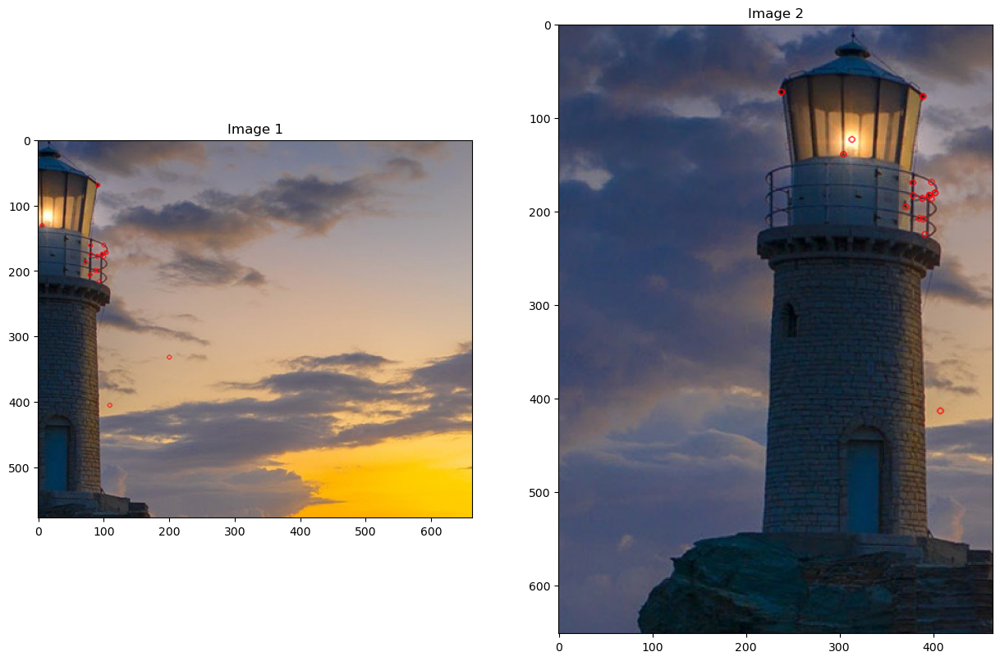

In [6]:
display(SIFT(img1, 20), SIFT(img2, 20), "Image 1", "Image 2")

# Task 2

After processing questions a, b, c. Those processed pictures are roughly the same as those of the originals.

Robustness of SIFT in each case:
- a) keypoints nearly identical between the scaled and original images.
- b) keypoints in the rotated image align well with the original ones.
- c) Noise introduced slight degradation in performance, leading to some spurious or missed keypoints.

Most robust type:
- a) scaling SIFT is moderate robust to scaling.
- b) rotation SIFT is very robust to rotation.
- c) noise SIFT shows less robustness to noise.





### a) Scaled with a factor of 120 percent.

In [7]:
def ScaleImg(image, scale = 1.2):
    height, width = image.shape[:2]
    new_dimension = (int(scale*width), int(scale*height))
    
    scaled_image = cv2.resize(image, new_dimension, interpolation=cv2.INTER_CUBIC)

    return scaled_image

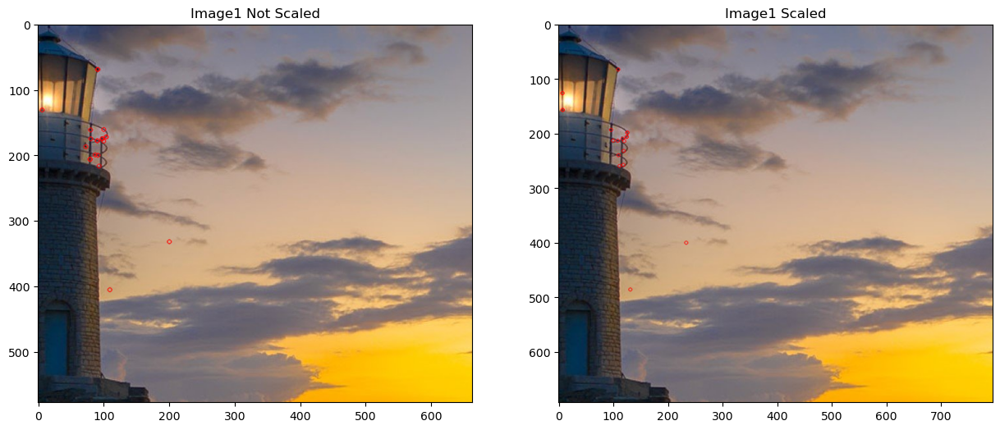

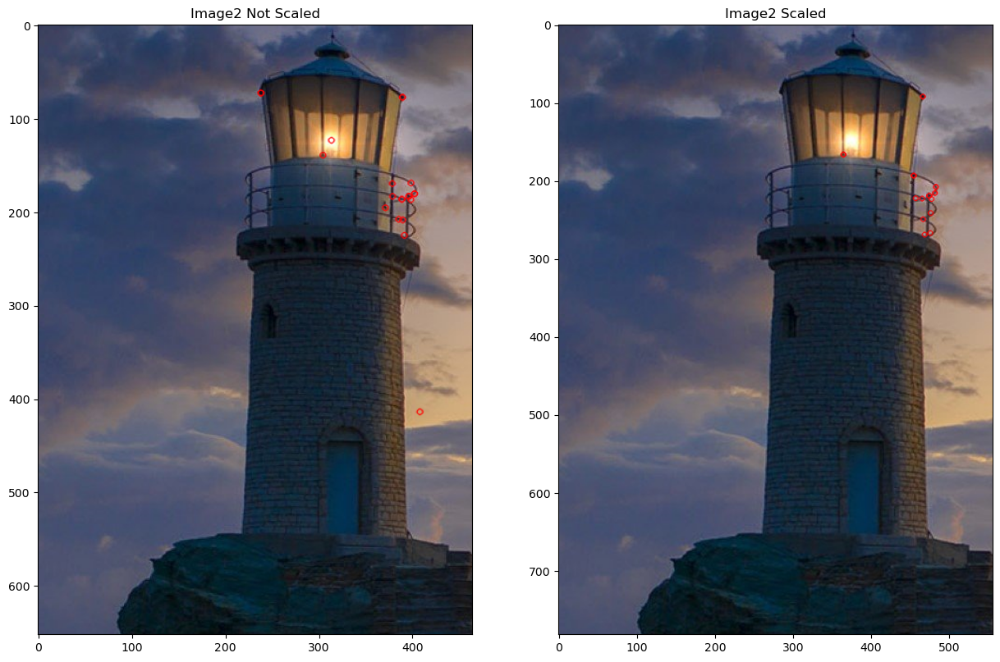

In [8]:
sift_scaled_img1 = SIFT(ScaleImg(img1), 20)
sift_scaled_img2 = SIFT(ScaleImg(img2), 20)

display(SIFT(img1, 20), sift_scaled_img1, "Image1 Not Scaled", "Image1 Scaled")
display(SIFT(img2, 20), sift_scaled_img2, "Image2 Not Scaled", "Image2 Scaled")

### b) Rotated clockwise by 60 degrees.

In [9]:
def RotateImg(image, angle = 60):
    height, width = image.shape[:2]
    center = (width//2, height//2)
    rotation = cv2.getRotationMatrix2D(center, angle, scale=1.0)
    
    rotated_image = cv2.warpAffine(image, rotation, (width, height))
    return rotated_image

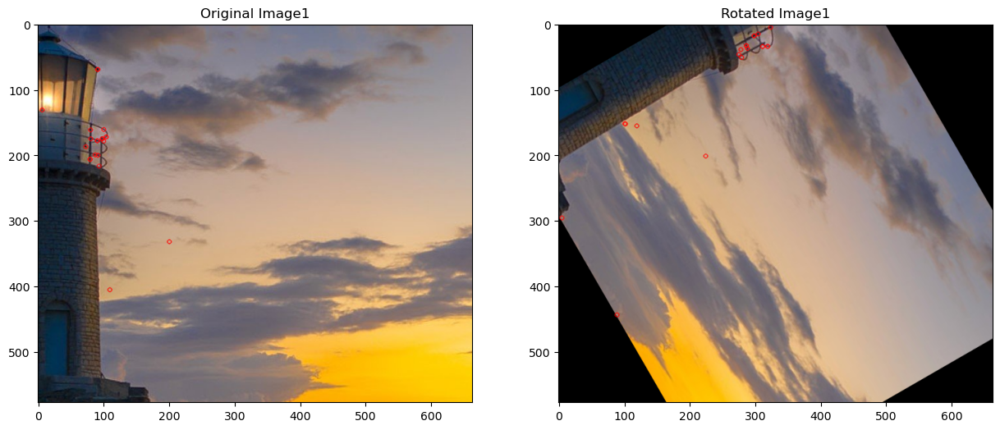

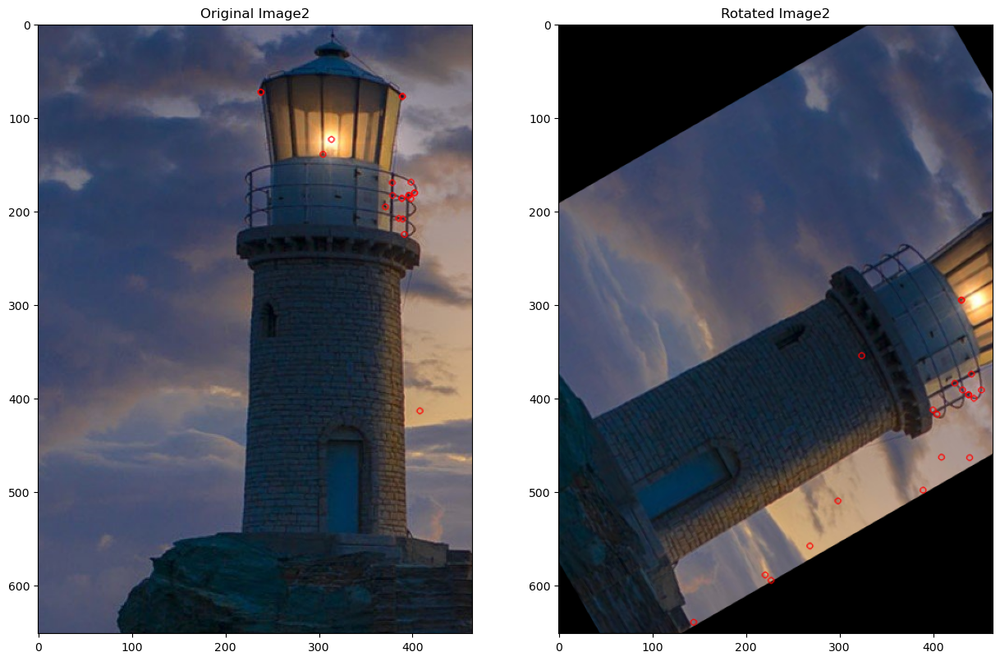

In [10]:
rotated_img1 = SIFT(RotateImg(img1, angle=-60), 20)
rotated_img2 = SIFT(RotateImg(img2, angle=-60), 20)


display(SIFT(img1, 20), rotated_img1, "Original Image1", "Rotated Image1")
display(SIFT(img2, 20), rotated_img2, "Original Image2", "Rotated Image2")

### c) Contaminated with salt and pepper noise.

In [11]:
def NoiseImg(image):
    image_float = image / 255
    noise = random_noise(image_float, mode='s&p', amount=0.05)

    noise_image = np.array(255 * noise, dtype='uint8')
    return noise_image

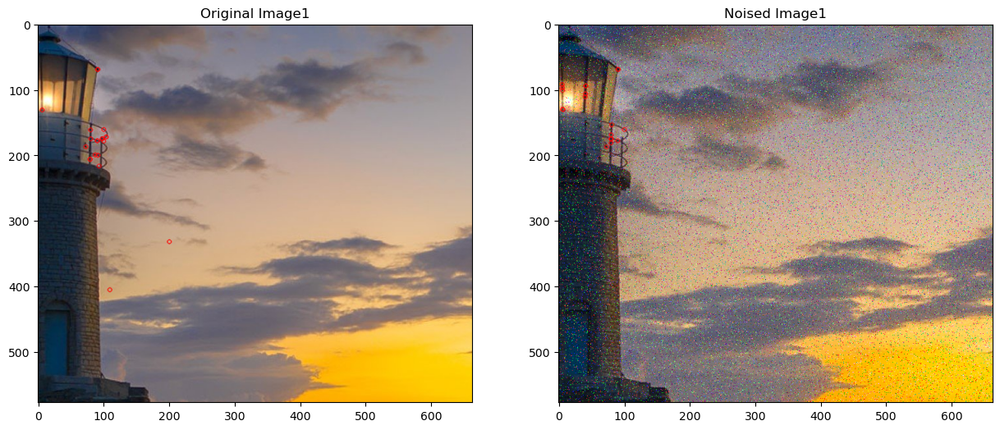

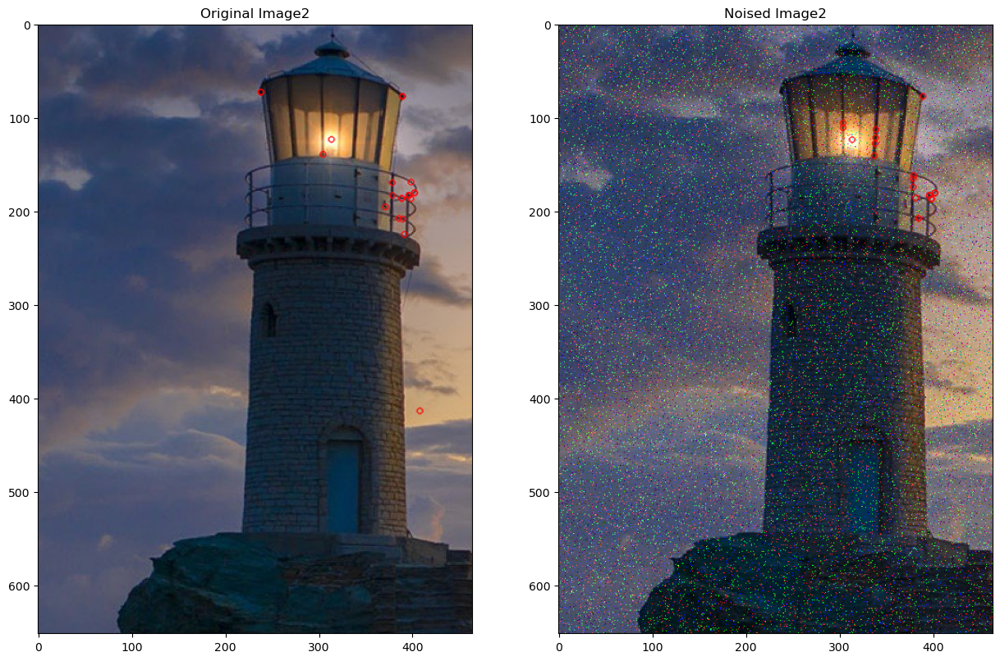

In [12]:
noised_img1 = SIFT(NoiseImg(img1), 20)
noised_img2 = SIFT(NoiseImg(img2), 20)


display(SIFT(img1, 20), noised_img1, "Original Image1", "Noised Image1")
display(SIFT(img2, 20), noised_img2, "Original Image2", "Noised Image2")

# Task 3

a) Match and stitch the two pictures

In [13]:
def DrawMatch(image1, image2, head=20):
    sift = cv2.SIFT_create(nfeatures=150)
    keypoints1, descriptors1 = sift.detectAndCompute(image1, None)
    keypoints2, descriptors2 = sift.detectAndCompute(image2, None)

    # Create BFMatcher object
    matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)

    # use its kNN-based matching method
    knn_matches = matcher.knnMatch(descriptors1, descriptors2, k=2)
    ratio_thresh = 0.75  # Typical ratio test value
    good_matches = []
    for m, n in knn_matches:
        if m.distance < ratio_thresh * n.distance:
            good_matches.append(m)

    matched_image = cv2.drawMatches(image1, keypoints1, image2, keypoints2, good_matches[:head], None, matchColor=(0, 0, 255),  flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    return matched_image

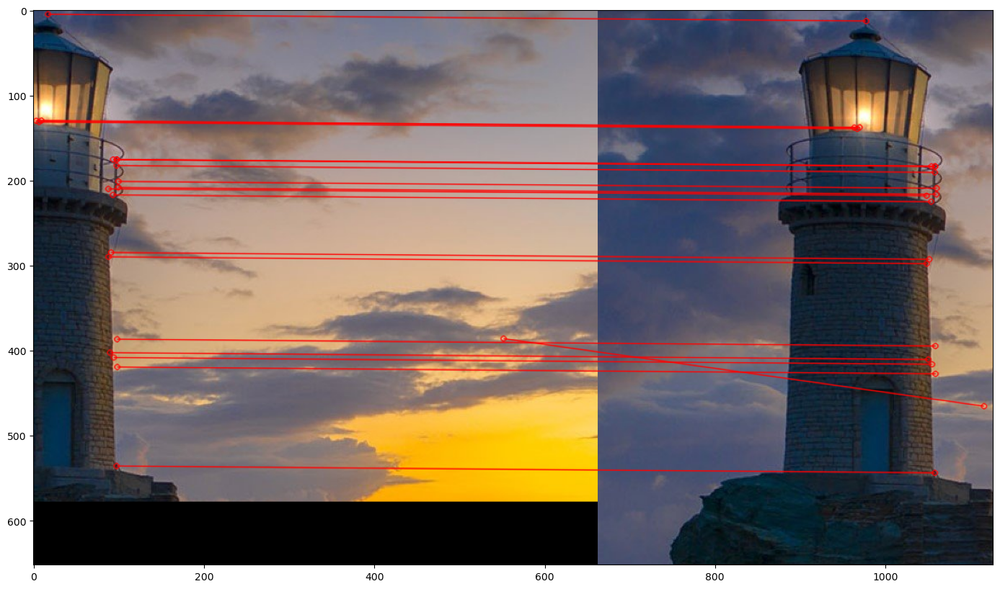

In [14]:
matched_image = DrawMatch(img1, img2)
plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(matched_image, cv2.COLOR_BGR2RGB))
plt.show()

b) create a single composite picture

In [15]:
def CompositeImages(image1, image2, head=20):
    sift = cv2.SIFT_create(nfeatures=150)
    keypoints1, descriptors1 = sift.detectAndCompute(image1, None)
    keypoints2, descriptors2 = sift.detectAndCompute(image2, None)

    # Create BFMatcher object
    matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)

    # use its kNN-based matching method
    knn_matches = matcher.knnMatch(descriptors1, descriptors2, k=2)
    ratio_thresh = 0.75  # Typical ratio test value
    good_matches = []
    for m, n in knn_matches:
        if m.distance < ratio_thresh * n.distance:
            good_matches.append(m)
    good_matches = good_matches[:head]

    src_pts = np.float32([keypoints1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([keypoints2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    # Use RANSAC algorithm
    mapping, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    height1, width1 = image1.shape[:2]
    height2, width2 = image2.shape[:2]

    composited_image = cv2.warpPerspective(image1, mapping, (width1+width2, max(height1, height2)))

    # Composite Images
    composited_image[0:height2, 0:width2] = image2
    return composited_image

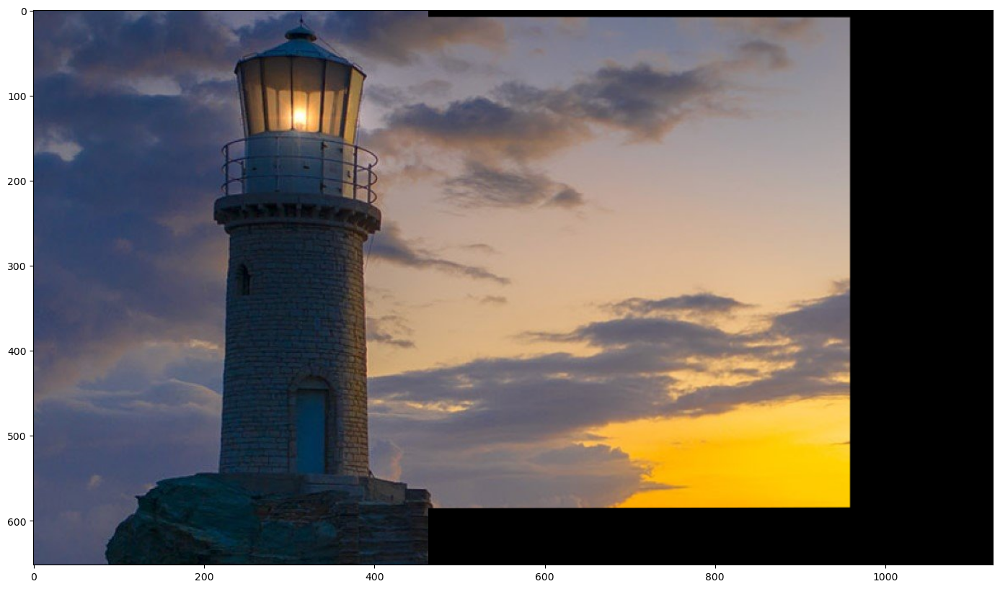

In [16]:
composited_image = CompositeImages(img1, img2, 50)
plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(composited_image, cv2.COLOR_BGR2RGB))
plt.show()